In [1]:
from google.colab import files
files.upload()  # pick kaggle.json


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"atharvasonar15","key":"e46e0c27d21317398756d8e051fd982b"}'}

In [2]:
!pip -q install kaggle
!mkdir -p ~/.kaggle
!mv /content/kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json


In [3]:
!kaggle -v
!kaggle competitions list | head


Kaggle API 1.7.4.5
ref                                                                              deadline             category                reward  teamCount  userHasEntered  
-------------------------------------------------------------------------------  -------------------  ---------------  -------------  ---------  --------------  
https://www.kaggle.com/competitions/arc-prize-2025                               2025-11-03 23:59:00  Featured         1,000,000 Usd        925           False  
https://www.kaggle.com/competitions/make-data-count-finding-data-references      2025-09-09 23:59:00  Research           100,000 Usd       1211           False  
https://www.kaggle.com/competitions/jigsaw-agile-community-rules                 2025-10-24 06:59:00  Featured           100,000 Usd       1120           False  
https://www.kaggle.com/competitions/mitsui-commodity-prediction-challenge        2025-10-06 23:59:00  Featured           100,000 Usd        794           False  
https://w

In [4]:
!kaggle competitions download -c dog-breed-identification -p /content
!unzip -q /content/dog-breed-identification.zip -d /content/dog-breed-identification


 99% 683M/691M [00:05<00:00, 122MB/s]
100% 691M/691M [00:05<00:00, 121MB/s]


In [5]:
!unzip -q -o /content/dog-breed-identification.zip -d /content/dog-breed-identification


In [6]:
!ls -lah /content/dog-breed-identification
!ls -1  /content/dog-breed-identification/train | head
!ls -1  /content/dog-breed-identification/test  | head
!wc -l  /content/dog-breed-identification/labels.csv


total 26M
drwxr-xr-x 4 root root 4.0K Sep  2 10:11 .
drwxr-xr-x 1 root root 4.0K Sep  2 10:11 ..
-rw-r--r-- 1 root root 471K Dec 11  2019 labels.csv
-rw-r--r-- 1 root root  25M Dec 11  2019 sample_submission.csv
drwxr-xr-x 2 root root 668K Sep  2 10:11 test
drwxr-xr-x 2 root root 636K Sep  2 10:11 train
000bec180eb18c7604dcecc8fe0dba07.jpg
001513dfcb2ffafc82cccf4d8bbaba97.jpg
001cdf01b096e06d78e9e5112d419397.jpg
00214f311d5d2247d5dfe4fe24b2303d.jpg
0021f9ceb3235effd7fcde7f7538ed62.jpg
002211c81b498ef88e1b40b9abf84e1d.jpg
00290d3e1fdd27226ba27a8ce248ce85.jpg
002a283a315af96eaea0e28e7163b21b.jpg
003df8b8a8b05244b1d920bb6cf451f9.jpg
0042188c895a2f14ef64a918ed9c7b64.jpg
000621fb3cbb32d8935728e48679680e.jpg
00102ee9d8eb90812350685311fe5890.jpg
0012a730dfa437f5f3613fb75efcd4ce.jpg
001510bc8570bbeee98c8d80c8a95ec1.jpg
001a5f3114548acdefa3d4da05474c2e.jpg
00225dcd3e4d2410dd53239f95c0352f.jpg
002c2a3117c2193b4d26400ce431eebd.jpg
002c58d413a521ae8d1a5daeb35fc803.jpg
002f80396f1e3db687c5932d7978b

In [7]:
DATA_DIR = "/content/dog-breed-identification"


In [8]:
import os, pandas as pd
print("labels.csv:", os.path.isfile(f"{DATA_DIR}/labels.csv"))
print("train imgs:", len(os.listdir(f"{DATA_DIR}/train")))
print("test  imgs:", len(os.listdir(f"{DATA_DIR}/test")))
labels = pd.read_csv(f"{DATA_DIR}/labels.csv")
labels.head()


labels.csv: True
train imgs: 10222
test  imgs: 10357


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF Hub Version:", tf.__version__)
print("TF version:", tf.__version__)

# check for gpu availabilty
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF Hub Version: 2.19.0
TF version: 2.19.0
GPU available


In [10]:
# Turning images into Tensors
# labels = pd.read_csv(f"{DATA_DIR}/labels.csv")
print(labels.describe())
print(labels.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

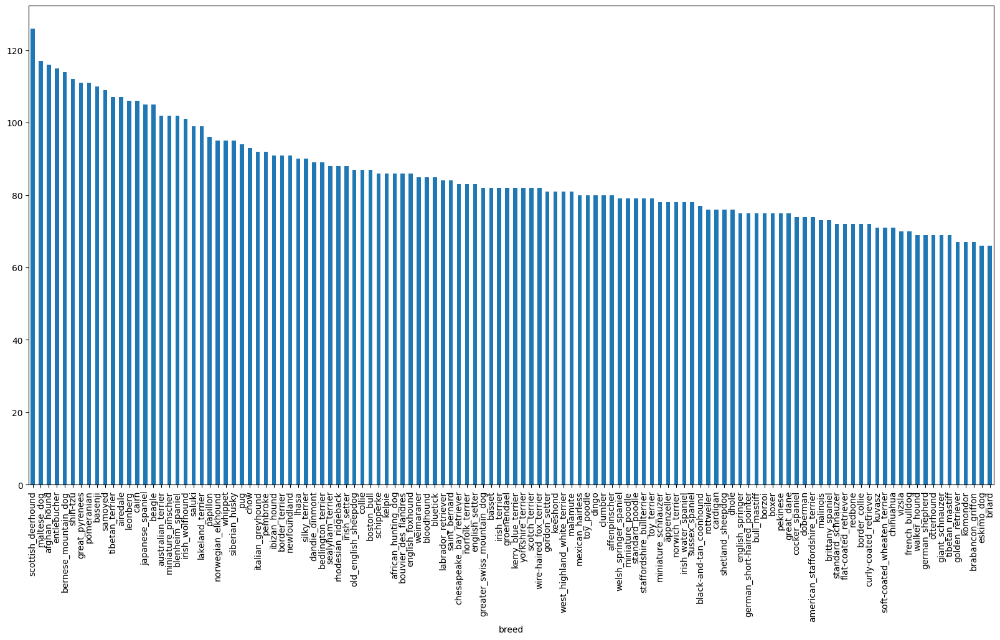

In [11]:
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [12]:
labels["breed"].value_counts().median()

82.0

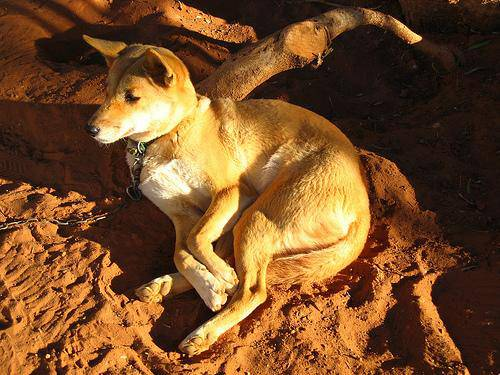

In [13]:
from IPython.display import Image
img_id = "001513dfcb2ffafc82cccf4d8bbaba97"
display(Image(filename=f"{DATA_DIR}/train/{img_id}.jpg"))

### Getting images and thier labels

In [14]:
filenames = [f"{DATA_DIR}/train/{fname}.jpg" for fname in labels["id"]]
filenames[:10]

['/content/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [15]:
# checking if number of filenames matches the number of actual image file
if len(os.listdir(f"{DATA_DIR}/train")) == len(filenames):
  print("Number of filenames matches the number of actual image files")
else:
  print("Number of filenames does not match the number of actual image files")

Number of filenames matches the number of actual image files


Now that we have our training image filepaths in a list, lets prepare our labels

In [16]:
import numpy as np
labels_breed = labels["breed"]
labels_breed = np.array(labels_breed)
labels_breed[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [17]:
len(labels_breed)

10222

In [18]:
if len(labels_breed) == len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not match the number of filenames")

Number of labels matches the number of filenames


In [19]:
# Finding the unique label values
unique_breeds = np.unique(labels_breed)
len(unique_breeds)

120

In [20]:
# Turn a single label into an array of booleans
print(labels_breed[0])
labels_breed[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels_breed]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Turning boolean array into integers
print(labels_breed[0])
print(np.where(unique_breeds == labels_breed[0])) # index where the label occurs
print(boolean_labels[0].argmax()) # index where 1 occurs in the array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our validation set as Kaggle does not come with its own validation set

In [24]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [25]:
len(filenames)

10222

In [26]:
# Starting experimenting with only 1000 images and increase as we progress.
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [27]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing images: Turnig images into Tensors
* Take an image filepath as input
* Use TF to read the file and save it to a variable (image)
* Turn our image(jpg) into Tensors
* Normalize our image (convert colour channel values from 0-255 to 0-1)
* Resize image to a shape of (224,224)
* Return the modified image


In [28]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
# Turning image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [30]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in the image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values, so computing will be more efficient
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image to (244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning our data into batches
* data needs to be in the form of tensor tuples: (image: label)




In [31]:
# Function to return a tuple of tensors

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [32]:
(process_image(X[42]), (y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## Function to turn all of our data (X and y) into batches

In [33]:
# Define the batch size, 32 (found through research)
BATCH_SIZE = 32

def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input, no labels
  """
  # if data is test dataset, we dont have labesl
  if test_data:
    print("creating test data batches ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is a valid dataset, no need to shuffle it
  elif valid_data:
    print("creating validation data batches ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("creating training data batches ")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # shuffling pathnames and labels before mapping
    data = data.shuffle(buffer_size=len(X))

    # creating (image, label) tuples
    data = data.map(get_image_label)

    # turning the tuples into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [34]:
# creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches 
creating validation data batches 


In [35]:
# attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing the data batches



In [36]:
import matplotlib.pyplot as plt

# Function for viewing images in a data batch
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])

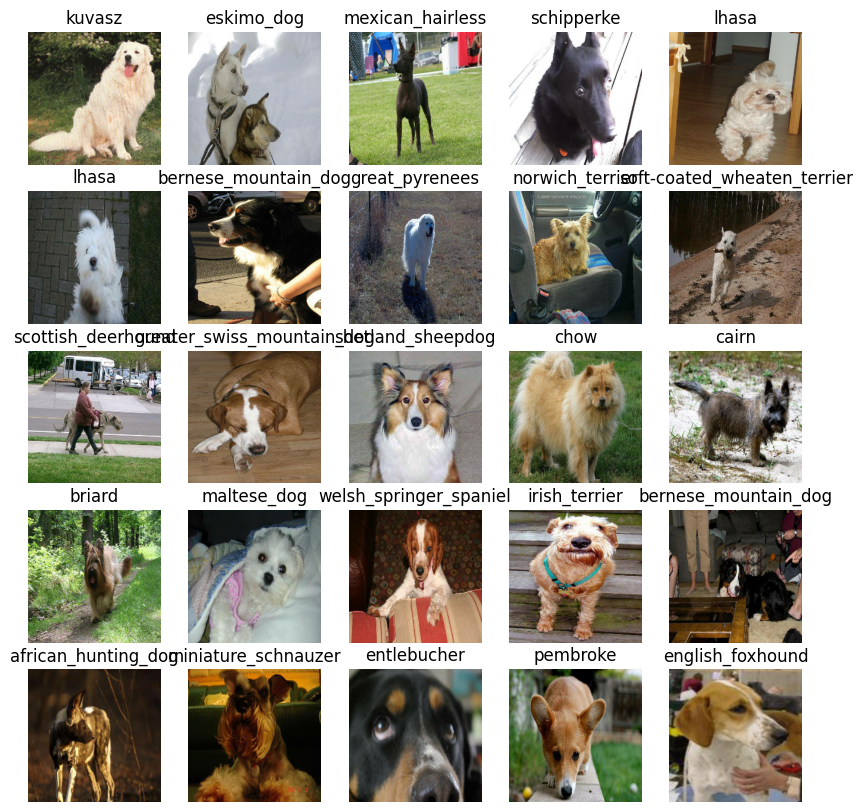

In [37]:
# Visualizing the training data
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

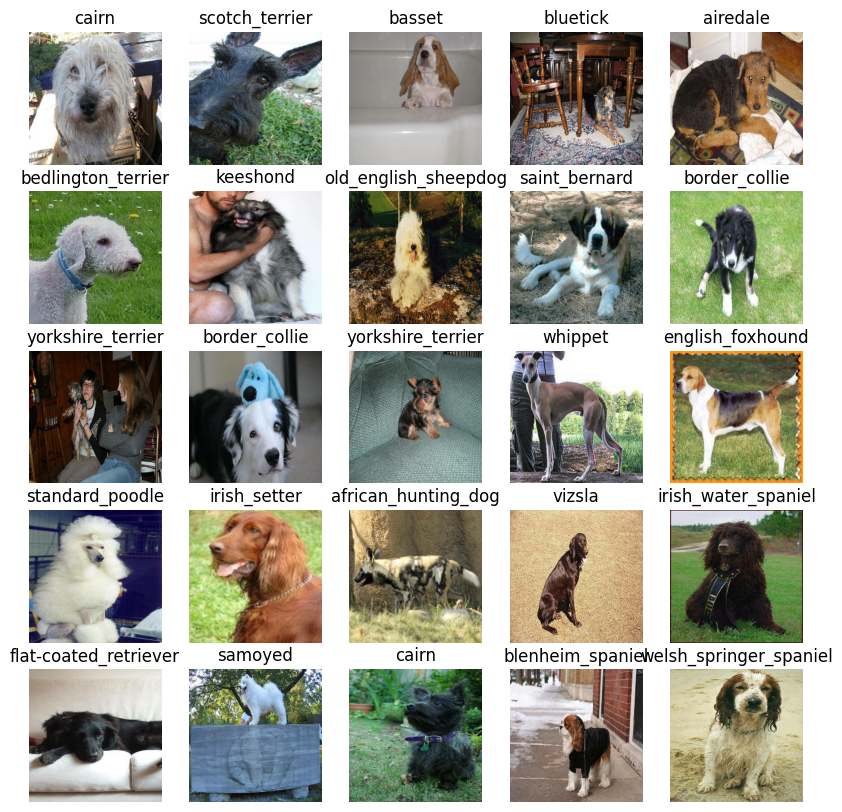

In [38]:
# Visualizing the validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
need to define:
* The input shape (images shape, in the form of tensors) to our model
* The Output shape (image labels, in the form of tensors) of our model
* URL of the model we want to use

In [39]:
IMG_SIZE = 224
INPUT_SHAPE  = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)

# Use feature_vector for transfer learning
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"


## We have our inputs, outputs and model ready so we can now put them in a Keras deep learning model
# We will need a function which:
* parameters: input shape, output shape, chosen model
* Defines the layers in a Keras model in a sequential fashion
* Complies the model
* Builds the model (the input shape it will be getting)
* Returns the model

In [40]:
import tf_keras as keras
import tensorflow as tf
import tensorflow_hub as hub

IMG_SIZE = 224
INPUT_SHAPE  = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL    = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"

def create_model():
    model = keras.Sequential([
        hub.KerasLayer(MODEL_URL, input_shape=INPUT_SHAPE, trainable=False, name="hub"),
        keras.layers.Dense(OUTPUT_SHAPE, activation="softmax", name="classifier"),
    ])
    model.compile(
        optimizer=keras.optimizers.Adam(),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy"],
    )
    return model



In [41]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hub (KerasLayer)            (None, 1280)              2257984   
                                                                 
 classifier (Dense)          (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


## Creating callbacks, TensorBoard Callback
1. load the tensorboard notebook
2. create a tensorboard callback which can save logs to a directory and pass it to our models fit() function
3. visualize our models training logs with %tensorboard function, after model training


In [42]:
%load_ext tensorboard

In [43]:
import datetime
def create_tensorboard_callback():
  log_dir = os.path.join("/content/dog-breed-identification/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)

In [44]:
# create early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training on a subset of data
our first model will only train on 1000 images to make sure everything is working

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10,max:100,step:10}

In [46]:
# Check to make sure we are running on gpu
print("GPU is available" if tf.config.list_physical_devices("GPU") else "GPU is not available")

GPU is available


## Creating a function which will train the model
* create model using create_model()
* setup a Tensorboard callback using create_tensorboard_callback()
* call the fit() function on our model passing the training data, validation data, number of epochs and callback we would like to use
* return the model

In [47]:
!pip -q install -U tf-keras tensorflow-hub


In [48]:
import tf_keras as keras
import tensorflow as tf
import tensorflow_hub as hub
import os, datetime

# callbacks FROM THE SAME keras
from tf_keras.callbacks import TensorBoard, EarlyStopping

def train_model(train_ds, val_ds, epochs=5):
    model = create_model()  # built with tf_keras.* in your notebook

    log_dir = os.path.join("/content/dog-breed-identification/logs",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    callbacks = [
        TensorBoard(log_dir=log_dir),
        EarlyStopping(patience=3, restore_best_weights=True),
    ]

    history = model.fit(train_ds, validation_data=val_ds,
                        epochs=epochs, callbacks=callbacks)
    return model, history


In [49]:
model, history = train_model(train_data, val_data, epochs=NUM_EPOCHS)


Epoch 1/100
25/25 [==============================] - 17s 176ms/step - loss: 4.3622 - accuracy: 0.1075 - val_loss: 3.4389 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 2s 74ms/step - loss: 1.7676 - accuracy: 0.7225 - val_loss: 2.1142 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 2s 65ms/step - loss: 0.7417 - accuracy: 0.9400 - val_loss: 1.6540 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 3s 103ms/step - loss: 0.3865 - accuracy: 0.9787 - val_loss: 1.4370 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 2s 75ms/step - loss: 0.2433 - accuracy: 0.9912 - val_loss: 1.3529 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 2s 64ms/step - loss: 0.1679 - accuracy: 0.9975 - val_loss: 1.2999 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 2s 75ms/step - loss: 0.1272 - accuracy: 0.9987 - val_loss: 1.2569 - val_accuracy: 0.6650
Epo

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created and visualize the contents

--> Model seems to be overfitting

In [50]:
%tensorboard --logdir /content/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [51]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 57ms/step


array([[7.4192579e-04, 3.2373908e-04, 3.0155521e-04, ..., 2.4317103e-04,
        3.9967428e-05, 3.6977089e-03],
       [2.9504561e-04, 1.2467350e-03, 1.0864545e-03, ..., 4.7213733e-05,
        2.4500703e-03, 1.3455797e-05],
       [1.4892363e-06, 7.4173535e-05, 4.9057544e-06, ..., 4.0740371e-05,
        6.1046921e-06, 1.3096266e-03],
       ...,
       [1.6868207e-06, 1.1981872e-05, 3.7633588e-06, ..., 2.8400686e-06,
        1.0338845e-05, 8.1121352e-06],
       [3.1992666e-05, 1.6942627e-06, 8.9946734e-06, ..., 2.3868881e-06,
        1.0943468e-06, 2.6826808e-04],
       [2.6953769e-05, 1.8409171e-05, 2.7215164e-04, ..., 9.6261018e-04,
        2.7443178e-04, 3.7777540e-04]], dtype=float32)

In [52]:
predictions.shape

(200, 120)

In [53]:
# First prediction
index=24
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.00591806e-06 7.00302655e-04 3.16576916e-06 6.75586989e-06
 6.36877940e-06 3.20748228e-08 1.37535849e-07 8.54455357e-06
 1.75950059e-04 1.30131557e-05 6.70288282e-05 2.24210351e-04
 2.91348556e-06 1.87707541e-03 1.76690537e-05 9.71525969e-06
 2.37269051e-05 9.95567461e-07 1.04724364e-04 3.59332648e-06
 3.46519255e-06 5.79909420e-06 2.01822687e-07 3.22358355e-05
 5.44874019e-05 1.41268106e-06 3.27549678e-05 7.81174003e-06
 1.27275725e-05 4.22957828e-06 2.67200994e-06 1.96116045e-03
 4.96714264e-01 8.59182110e-05 1.72470463e-05 1.02463873e-05
 3.19242190e-06 1.03393290e-06 1.56500528e-06 8.46371222e-06
 9.17021278e-03 1.62135460e-04 4.82272355e-07 4.44601892e-06
 6.09223071e-06 1.46520915e-06 4.48325773e-06 1.05988940e-04
 7.19553736e-06 5.25168907e-05 2.42965689e-05 2.00001123e-05
 1.19298697e-04 9.55627229e-07 4.15796922e-06 1.48970139e-06
 6.15135767e-04 2.20846941e-05 3.11784061e-05 3.26231275e-05
 7.31391992e-06 1.22810279e-05 6.14570126e-06 7.44203089e-06
 1.39845770e-06 2.555857

In [54]:
# Turn probablities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probalities

pred_label = get_pred_label(predictions[14])
pred_label

'english_foxhound'

Since our validation dataset is batched, we will have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []
  for image, label in data.unbatch():
    images.append(image.numpy())
    labels.append(unique_breeds[label.numpy().argmax()])
  return images, labels

In [57]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Let's create a function that will better help us visualize the array of prediction probablities

Function should
* Take an array of prediction probablitiies, array of truth labels and an array of images and integers
* Convert the prediciton probablities to a predicted label
* Plot the predicted label, predicted probablity, truth label and the target image on a single plot


In [66]:
import matplotlib.pyplot as plt

def plot_pred(prediction_probabilities, labels, images, n, ax=None):
  """
  View the prediction, ground truth label and image for sample n on a given axis.
  If ax is None, a new figure and axis are created.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  if ax is None:
      fig, ax = plt.subplots() # Create a new figure and axis if none is provided

  ax.imshow(image)
  ax.set_xticks([])
  ax.set_yticks([])
  title_color = "green" if pred_label == true_label else "red"
  ax.set_title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=title_color)

  if ax is None:
      plt.show() # Show the plot only if a new figure was created within the function

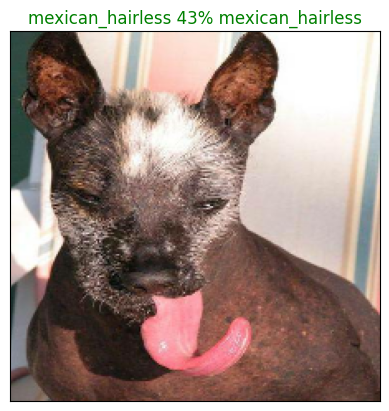

In [67]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=33)

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob) # Get the predicted label for the sample

  # Get the top 10 prediction values and their corresponding indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indices]
  top_10_pred_labels = np.array(unique_breeds)[top_10_pred_indices]


  bar_colors = ["grey"] * len(top_10_pred_labels)

  # Find the index of the true label within the top 10 predicted labels
  if true_label in top_10_pred_labels:
      true_label_index_in_top_10 = np.where(top_10_pred_labels == true_label)[0][0]
      bar_colors[true_label_index_in_top_10] = "green" # Set the color of the true label's bar to green


  plt.figure(figsize=(10, 6))
  plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color=bar_colors, align="center")

  # Set the x-axis ticks and labels
  plt.xticks(np.arange(len(top_10_pred_labels)), top_10_pred_labels, rotation="vertical")
  plt.title(f"Top 10 Predictions for Sample {n}")
  plt.ylabel("Probability")
  plt.ylim([0, 1])

  plt.tight_layout()
  plt.show()

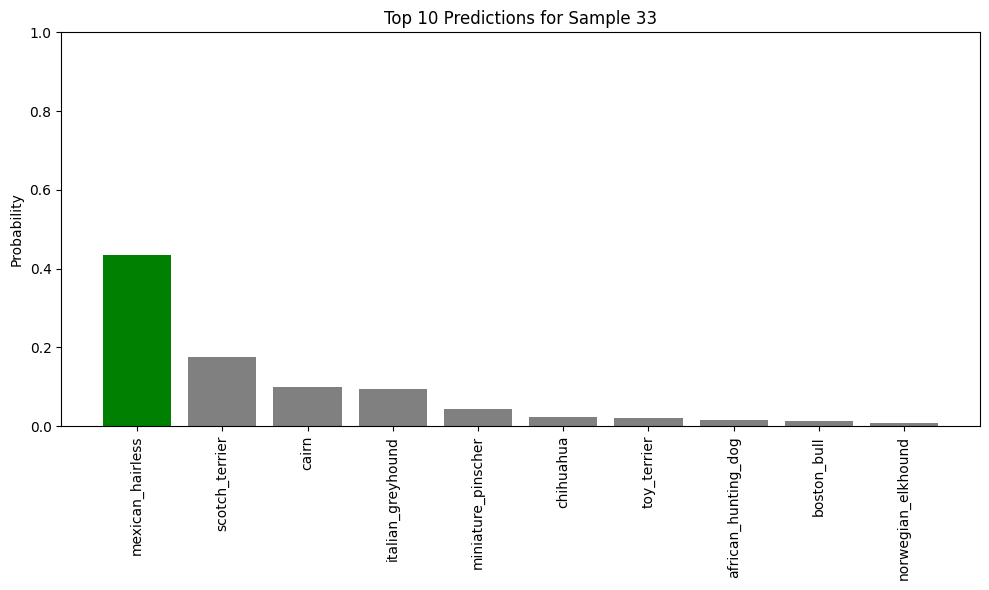

In [69]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=33)

Now we have two ways of visualizing the predictions and evaluate our model.

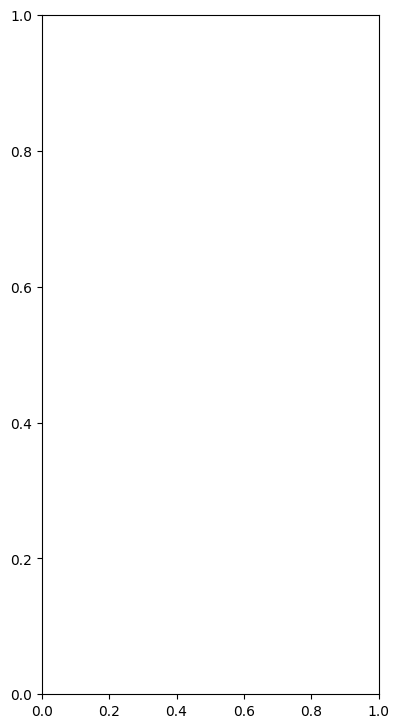

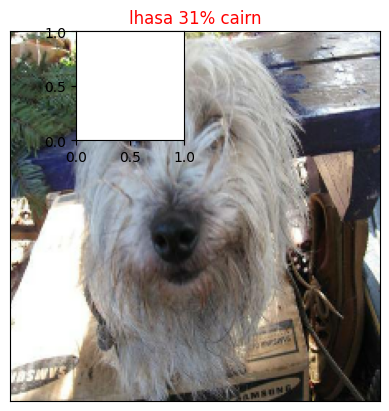

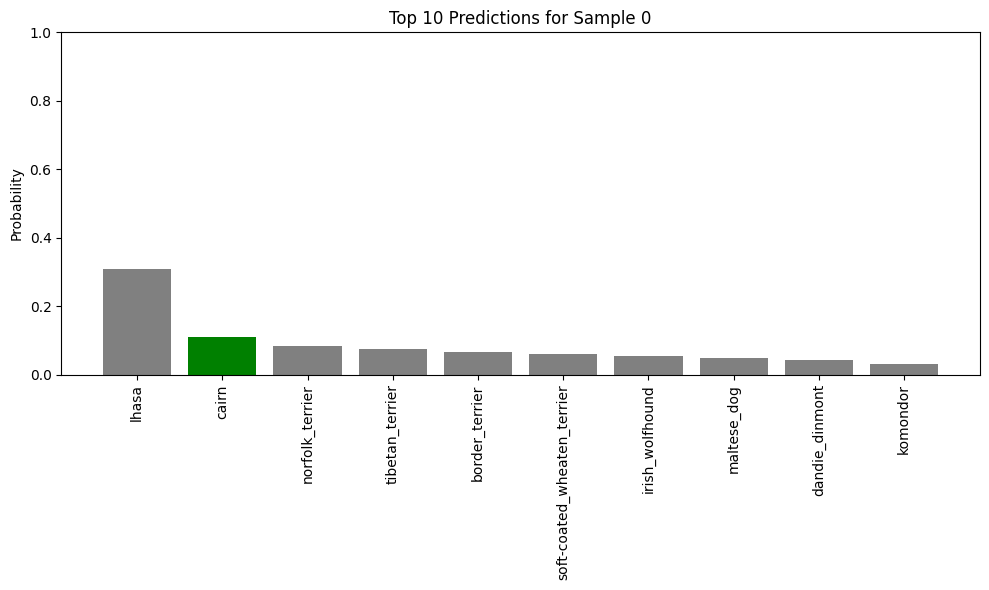

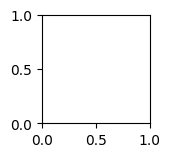

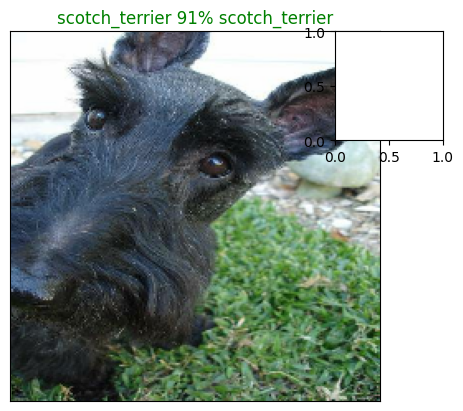

...

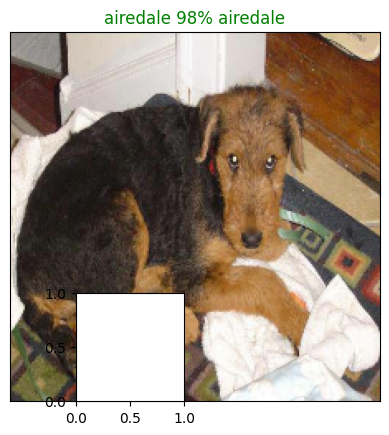

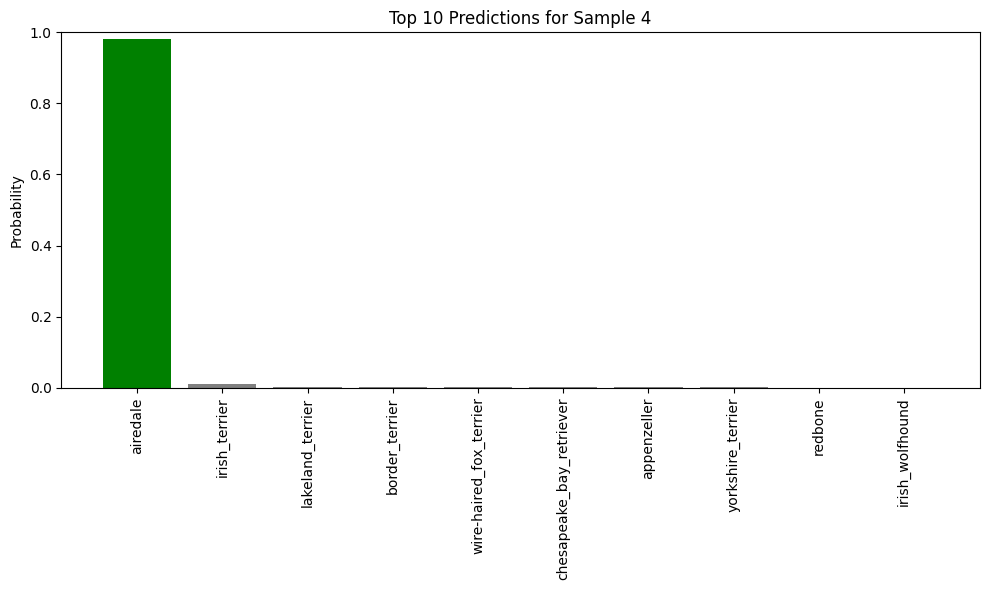

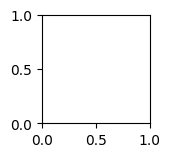

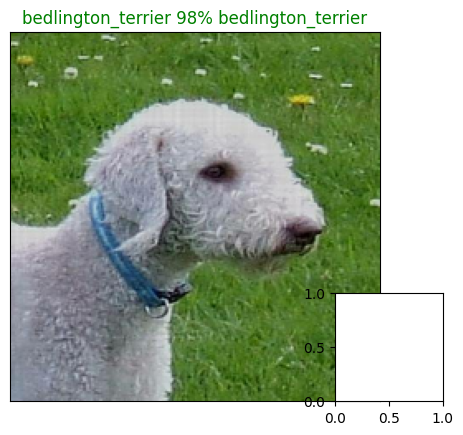

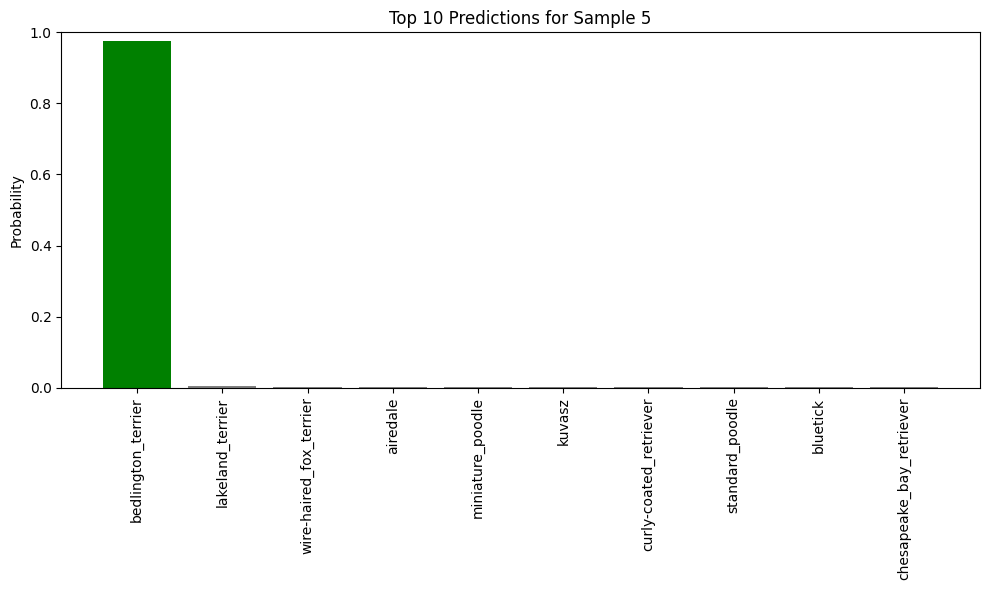

<Figure size 640x480 with 0 Axes>

In [70]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 10*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
  plt.tight_layout()
plt.show()


## Saving and reloading a model

In [71]:
# Create a function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """

  modeldir = os.path.join("/content/dog-breed-identification/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
# Create a function to load a trained model
import pickle
import tensorflow as tf
import tensorflow_hub as hub

def load_model(filename):
    """
    Loads a trained model from a specified filename.
    """
    print(f"Loading saved model from: {filename}")
    # Ensure custom objects are provided for loading models with KerasLayer from TensorFlow Hub
    model = tf.keras.models.load_model(filename, custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [73]:
# save our model trained on 1000 images
save_model(model,suffix="1000-images-v2")

Saving model to: /content/dog-breed-identification/models/20250902-10181756808287-1000-images-v2.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/dog-breed-identification/models/20250902-10181756808287-1000-images-v2.h5'

## Training a model on the full data

In [74]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

creating training data batches 


In [75]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# Create a model for the full data
full_model = create_model()

In [77]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                              patience=3)


In [79]:
# Create full model callbacks
from tf_keras.callbacks import TensorBoard, EarlyStopping
import os, datetime

log_dir = os.path.join(
    "/content/dog-breed-identification/logs",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
)

full_model_tensorboard = TensorBoard(log_dir=log_dir)
full_model_early_stopping = EarlyStopping(
    monitor="accuracy",
    patience=3,
    restore_best_weights=True
)




In [80]:
# Fit the full model to the full data
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping]
)

Epoch 1/100
320/320 [==============================] - 23s 55ms/step - loss: 1.3413 - accuracy: 0.6763
Epoch 2/100
320/320 [==============================] - 17s 54ms/step - loss: 0.4113 - accuracy: 0.8856
Epoch 3/100
320/320 [==============================] - 17s 54ms/step - loss: 0.2587 - accuracy: 0.9342
Epoch 4/100
320/320 [==============================] - 17s 53ms/step - loss: 0.1757 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 17s 53ms/step - loss: 0.1254 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0913 - accuracy: 0.9882
Epoch 7/100
320/320 [==============================] - 17s 54ms/step - loss: 0.0705 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 17s 53ms/step - loss: 0.0546 - accuracy: 0.9958
Epoch 9/100
320/320 [==============================] - 19s 59ms/step - loss: 0.0429 - accuracy: 0.9981
Epoch 10/100
320/320 [==============================] - 17s 53ms/step - l

In [81]:
save_model(full_model, suffix="full-data-v2")

Saving model to: /content/dog-breed-identification/models/20250902-10421756809774-full-data-v2.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/dog-breed-identification/models/20250902-10421756809774-full-data-v2.h5'

## Making predicitons on the test dataset
since our model has been trained on images in the form of Tensor batches, to make predicitons on the test data, to make predictions on test data we need it in the same format

We will need:
* test image filenames
* convert filenames into test data bacthes
* make predictions array by passing the test batches to the predict() method called in our model

In [83]:
# Load test image filenames
test_path = "/content/dog-breed-identification/test"
test_filenames = [os.path.join(test_path, filename) for filename in os.listdir(test_path)]
test_filenames[:10]

['/content/dog-breed-identification/test/cd1cde627d7abab7c102c1ee1a6da0d2.jpg',
 '/content/dog-breed-identification/test/43a411e0747a0b39cbbed7802c5b6013.jpg',
 '/content/dog-breed-identification/test/37f91f5de2d6ecedb6abebff33d7fa17.jpg',
 '/content/dog-breed-identification/test/9ecaa9a16c74f6e818188b95785eab6b.jpg',
 '/content/dog-breed-identification/test/997078637af920e74676b807734795d7.jpg',
 '/content/dog-breed-identification/test/b97c65ed477941beb476a370e426f18b.jpg',
 '/content/dog-breed-identification/test/1c8830e9687bdadd13bab1cf14ee33cd.jpg',
 '/content/dog-breed-identification/test/297517505e03ecbbcff2039bfe14e56a.jpg',
 '/content/dog-breed-identification/test/b354c4a3a0034b93545a6a2cd4c3f54e.jpg',
 '/content/dog-breed-identification/test/6198add2c6df42226a134f5e62a0a199.jpg']

In [85]:
len(test_filenames)

10357

In [86]:
test_data = create_data_batches(test_filenames, test_data=True)

creating test data batches 


In [87]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [88]:
# Make predictions on test data batch using full model
test_predictions = full_model.predict(test_data, verbose=1)

324/324 [==============================] - 20s 58ms/step


In [89]:
test_predictions[:10]

array([[4.6762318e-05, 1.2977312e-02, 5.6251270e-08, ..., 1.6037178e-06,
        1.2045079e-07, 1.3625486e-08],
       [7.1710131e-11, 6.6128596e-09, 1.0552651e-09, ..., 5.6564033e-05,
        7.2302013e-05, 1.1951199e-09],
       [7.3974087e-07, 1.0515752e-08, 2.0509475e-08, ..., 8.3163769e-07,
        6.7471794e-04, 6.4567601e-08],
       ...,
       [1.3771203e-08, 6.0470157e-08, 2.8922707e-06, ..., 5.0513510e-05,
        1.6237703e-07, 5.7360396e-09],
       [1.8734880e-06, 1.6436777e-11, 4.3180911e-08, ..., 1.4521421e-05,
        1.3679601e-09, 1.9491731e-06],
       [4.1078252e-13, 2.1281607e-11, 1.7856841e-10, ..., 2.6457053e-06,
        5.6788907e-09, 4.2762023e-11]], dtype=float32)

In [90]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for submissions

In [91]:
preds_df = pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [92]:
# Append test image ID's to predictions Data frame
test_ids = [os.path.splitext(os.path.basename(filename))[0] for filename in test_filenames]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,cd1cde627d7abab7c102c1ee1a6da0d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,43a411e0747a0b39cbbed7802c5b6013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,37f91f5de2d6ecedb6abebff33d7fa17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9ecaa9a16c74f6e818188b95785eab6b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,997078637af920e74676b807734795d7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [93]:
# Add the prediction probablities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,cd1cde627d7abab7c102c1ee1a6da0d2,4.676232e-05,1.297731e-02,5.625127e-08,3.543807e-08,8.632255e-09,9.278516e-11,4.684401e-10,1.155414e-08,2.482749e-09,...,7.526757e-06,1.808218e-09,1.114419e-07,5.877039e-09,5.111224e-09,6.228922e-07,7.142508e-09,1.603718e-06,1.204508e-07,1.362549e-08
1,43a411e0747a0b39cbbed7802c5b6013,7.171013e-11,6.612860e-09,1.055265e-09,2.846154e-08,1.777220e-07,1.088452e-04,3.040632e-09,6.899662e-08,1.688003e-07,...,1.153557e-08,1.257772e-06,2.033885e-07,2.364662e-01,1.446195e-09,3.268689e-04,3.909637e-09,5.656403e-05,7.230201e-05,1.195120e-09
2,37f91f5de2d6ecedb6abebff33d7fa17,7.397409e-07,1.051575e-08,2.050948e-08,2.339560e-07,5.189818e-07,5.538404e-08,3.546125e-09,5.606415e-08,1.450870e-09,...,4.154845e-07,3.441936e-09,1.379575e-08,2.104173e-10,6.999045e-09,2.114275e-09,4.645087e-09,8.316377e-07,6.747179e-04,6.456760e-08
3,9ecaa9a16c74f6e818188b95785eab6b,1.536833e-11,5.450408e-10,1.071904e-07,1.816725e-07,1.244841e-07,1.823818e-05,2.270148e-07,9.806467e-01,1.946077e-06,...,5.399114e-08,1.024344e-02,4.195683e-09,1.603352e-05,5.813344e-08,3.451762e-09,6.707510e-07,1.374578e-05,1.212909e-06,1.087045e-08
4,997078637af920e74676b807734795d7,1.363069e-08,1.861404e-08,1.442131e-08,6.387993e-09,1.133587e-10,1.795422e-12,4.018939e-10,1.697986e-12,1.041231e-12,...,6.425104e-09,4.844779e-14,6.800133e-07,4.383332e-11,7.791867e-08,5.133256e-10,1.449316e-10,2.210628e-08,4.147765e-13,4.383073e-11
